### Imports

In [49]:
import cv2
import numpy as np
import os
from dataset import configdataset
from sklearn.cluster import MiniBatchKMeans
import glob
import pickle
from tqdm import tqdm
import matplotlib.pyplot as plt
from evaluate import compute_map, compute_ap
import random
import torchvision.transforms as transforms
from torchvision.models import resnet50
import torch
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
import torch.nn as nn
from torchvision import models
import time
from pyflann import FLANN

### Clase RootSift 
extraida de https://pyimagesearch.com/2015/04/13/implementing-rootsift-in-python-and-opencv/

In [50]:
class RootSIFT:
    def __init__(self):
        # initialize the SIFT feature extractor
        self.sift = cv2.SIFT_create()
    
    def compute(self, image, kps, eps=1e-7, max_features=1000):
        # Limit keypoints if more than max_features
        if len(kps) > max_features:
            kps = kps[:max_features]
        
        # compute SIFT descriptors
        (kps, descs) = self.sift.compute(image, kps)
        
        # if there are no keypoints or descriptors, return an empty tuple
        if len(kps) == 0:
            return ([], None)
        
        # apply the Hellinger kernel by first L1-normalizing and taking the
        # square-root
        descs /= (descs.sum(axis=1, keepdims=True) + eps)
        descs = np.sqrt(descs)
        
        # return a tuple of the keypoints and descriptors
        return (kps, descs)

### Codigo para extraer caracteristicas SIFT

In [51]:
def extract_and_save_sift(cfg, output_dir, max_features=1000, extrac_query=False):
    # Crear directorio de salida
    sift_dir = output_dir
    os.makedirs(sift_dir, exist_ok=True)

    # Configurar SIFT con número máximo de características
    sift = cv2.SIFT_create(nfeatures=max_features)
    rs = RootSIFT()

    # Elegir la configuración de imágenes
    total_images = cfg['nq'] if extrac_query else cfg['n']
    fname_func = cfg['qim_fname'] if extrac_query else cfg['im_fname']

    # Procesar imágenes
    for i in tqdm(range(total_images), desc="Extrayendo Caracteristicas"):
        img_path = fname_func(cfg, i)  # Cambia la función si son queries
        img_name = os.path.basename(img_path).split('.')[0]
        output_path = os.path.join(sift_dir, f"{img_name}.npy")

        # Cargar imagen
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar imagen: {img_path}")
            continue

        # Extraer descriptores
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        kps = sift.detect(gray)
        kps, des = rs.compute(gray, kps, max_features=max_features)

        # Si no se encuentran descriptores, guardar vector dummy
        if des is None or len(des) == 0:
            des = np.zeros((1, 128), dtype=np.float32)

        np.save(output_path, des)




### Codigo para extraer caracteristicas CNN

In [52]:
def extrac_and_save_cnn(cfg, output_dir, extrac_query=False):
    # Crear directorio de salida
    cnn_dir = output_dir
    os.makedirs(cnn_dir, exist_ok=True)

    # Configurar CNN
    model = resnet50(pretrained=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model = model.eval()

    # Elegir la configuración de imágenes
    total_images = cfg['nq'] if extrac_query else cfg['n']
    fname_func = cfg['qim_fname'] if extrac_query else cfg['im_fname']

    # Procesar imágenes
    for i in tqdm(range(total_images), desc="Extrayendo Caracteristicas"):
        img_path = fname_func(cfg, i)  # Cambia la función si son queries
        img_name = os.path.basename(img_path).split('.')[0]
        output_path = os.path.join(cnn_dir, f"{img_name}.npy")

        # Cargar imagen
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar imagen: {img_path}")
            continue

        # Preprocesar imagen
        img = cv2.resize(img, (224, 224))
        img = img[..., ::-1]  # BGR -> RGB
        img = np.transpose(img, (2, 0, 1))  # HWC -> CHW
        img = img / 255.0
        img = np.expand_dims(img, axis=0)
        img = torch.from_numpy(img).float().to(device)

        # Extraer características
        with torch.no_grad():
            features = model(img)
            features = features.cpu().numpy()

        # Guardar características
        np.save(output_path, features)

### Codigo mejora CNN utilizando gem pooling

In [53]:
def gem_pooling(x, p=3, eps=1e-6):
    return torch.mean(x.clamp(min=eps).pow(p), dim=(-2, -1)).pow(1 / p)

def extrac_and_save_cnn_gem(cfg, output_dir, extrac_query=False, p=3):
    os.makedirs(output_dir, exist_ok=True)
    
    total_images = cfg['nq'] if extrac_query else cfg['n']
    fname_func = cfg['qim_fname'] if extrac_query else cfg['im_fname']

    # Verificar si todas las características ya fueron extraídas
    if all(
        os.path.exists(os.path.join(output_dir, f"{os.path.basename(fname_func(cfg, i)).split('.')[0]}.npy"))
        for i in range(total_images)
    ):
        return  # Salir de la función si todas las características ya existen

    # Resto del código de extracción de características permanece igual
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Cargar modelo ResNet50
    model = models.resnet50(pretrained=True)
    model = nn.Sequential(*list(model.children())[:-2])  # Quitar las capas FC
    model = model.to(device).eval()

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    for i in tqdm(range(total_images), desc="Extrayendo CNN con GeM"):
        img_path = fname_func(cfg, i)
        img_name = os.path.basename(img_path).split('.')[0]
        output_path = os.path.join(output_dir, f"{img_name}.npy")

        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar imagen: {img_path}")
            continue

        img = cv2.resize(img, (224, 224))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            features = model(img)  # Extraer características convolucionales
            gem_features = gem_pooling(features, p=p)  # Aplicar GeM pooling
            gem_features = gem_features.cpu().numpy()

        np.save(output_path, gem_features)

### Entrenamiento de Kmeans

In [54]:
def train_kmeans(descriptors_dir, n_clusters=5000, output_model='kmeans_model.pkl'):
    all_descriptors = []
    for file in glob.glob(f"{descriptors_dir}/*.npy"):
        des = np.load(file).astype(np.float32)  
        all_descriptors.append(des)
    
    # Concatenar descriptores
    all_descriptors = np.vstack(all_descriptors)
    print(f"Total descriptores: {all_descriptors.shape}")

    # Entrenar MiniBatchKMeans
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=10000, max_iter=10000)
    kmeans.fit(all_descriptors)

    # Convertir centros a float32 y guardar modelo completo
    kmeans.cluster_centers_ = kmeans.cluster_centers_.astype(np.float32)
    with open(output_model, 'wb') as f:
        pickle.dump(kmeans, f)

    print("Modelo KMeans guardado en:", output_model)


### Codificacion de imagenes

In [55]:
def encode_images(cfg, kmeans_model, descriptors_dir, output_vectors, is_query=False):
    with open(kmeans_model, 'rb') as f:
        kmeans = pickle.load(f)

    X = []
    total_images = cfg['nq'] if is_query else cfg['n']
    fname_func = cfg['qim_fname'] if is_query else cfg['im_fname']
    
    for i in tqdm(range(total_images), desc="Codificando imágenes"):
        img_name = os.path.basename(fname_func(cfg, i)).split('.')[0]
        des_path = os.path.join(descriptors_dir, f"{img_name}.npy")
        des = np.load(des_path).astype(np.float32)
        
        if des.shape[0] == 0:  # Empty descriptor case
            hist = np.zeros(kmeans.n_clusters, dtype=np.float32)
        else:
            labels = kmeans.predict(des)
            hist, _ = np.histogram(labels, bins=np.arange(kmeans.n_clusters + 1))
        
        X.append(hist)
    
    np.save(output_vectors, np.array(X, dtype=np.float32))
    print(f"Vectores codificados guardados en: {output_vectors}")


## Parte mejora CNN

In [56]:
def apply_pca_whitening(descriptors_dir, output_file, n_components=512):
    if os.path.exists(output_file):
        print(f"PCA Whitening ya existe: {output_file}")
        with open(output_file, 'rb') as f:
            return pickle.load(f)

    descriptors = []
    for file in glob.glob(f"{descriptors_dir}/*.npy"):
        desc = np.load(file)
        descriptors.append(desc)

    descriptors = np.vstack(descriptors)
    print(f"Aplicando PCA Whitening sobre {descriptors.shape[0]} descriptores...")

    pca = PCA(n_components=n_components, whiten=True)
    descriptors_pca = pca.fit_transform(descriptors)

    with open(output_file, 'wb') as f:
        pickle.dump(pca, f)
    print(f"PCA Whitening guardado en: {output_file}")

    return pca
def encode_with_pca(cfg, pca_model, descriptors_dir, output_vectors, is_query=False):
    if os.path.exists(output_vectors):
        print(f"Vectores ya codificados: {output_vectors}")
        return

    with open(pca_model, 'rb') as f:
        pca = pickle.load(f)

    X = []
    total_images = cfg['nq'] if is_query else cfg['n']
    fname_func = cfg['qim_fname'] if is_query else cfg['im_fname']

    for i in tqdm(range(total_images), desc="Codificando con PCA Whitening"):
        img_name = os.path.basename(fname_func(cfg, i)).split('.')[0]
        des_path = os.path.join(descriptors_dir, f"{img_name}.npy")
        des = np.load(des_path).reshape(1, -1)
        des_pca = pca.transform(des)
        X.append(des_pca.flatten())

    np.save(output_vectors, np.array(X, dtype=np.float32))

### Similitud coseno y rank de imagenes segun paper

In [57]:
def cosine_similarity(X, Q):
    X_norm = X / np.linalg.norm(X, axis=1, keepdims=True)  
    Q_norm = Q / np.linalg.norm(Q, axis=1, keepdims=True)  
    sim = np.dot(X_norm, Q_norm.T)  
    return sim
def rank_images(sim):
    ranks = np.argsort(-sim, axis=0) 
    return ranks

### Evaluacion del modelo usando mAP (metodos paper)

In [58]:
def evaluate_model(ranks, gnd):
    ks = [1, 5, 10]  # Precision en top-K
    results = {}
    # Easy evaluation
    gnd_t = [{'ok': g['easy'], 'junk': np.concatenate([g['junk'], g['hard']])} for g in gnd]
    mapE, _, _, _ = compute_map(ranks, gnd_t, ks)
    results['Easy'] = mapE
    # Medium evaluation
    gnd_t = [{'ok': np.concatenate([g['easy'], g['hard']]), 'junk': g['junk']} for g in gnd]
    mapM, _, _, _ = compute_map(ranks, gnd_t, ks)
    results['Medium'] = mapM
    # Hard evaluation
    gnd_t = [{'ok': g['hard'], 'junk': np.concatenate([g['junk'], g['easy']])} for g in gnd]
    mapH, _, _, _ = compute_map(ranks, gnd_t, ks)
    results['Hard'] = mapH
    return results


### Funcion para mostrar un top 5 de querys usando AP 

In [59]:
def display_query_and_top5(ranks, gnd, cfg, top_k=5):  
    aps = []
    for i in range(len(gnd)):
        if len(gnd[i]['easy']) == 0:  # Si no tiene 'easy', AP es 0.
            aps.append(0)
        else:
            ranks_query = ranks[:, i]
            qgnd = np.array(gnd[i]['easy'])
            pos = np.where(np.in1d(ranks_query, qgnd))[0]
            aps.append(compute_ap(pos, len(qgnd)))

    aps = np.array(aps)

    # Índices válidos (AP > 0)
    valid_idx = np.where(aps > 0)[0]  

    # Seleccionar top 3 mejores AP
    top3_idx = valid_idx[np.argsort(aps[valid_idx])[-3:]]  # Últimos 3 son los mejores
    random_best_idx = random.choice(top3_idx)  # Seleccionar uno al azar del top 3

    # Seleccionar el peor AP
    worst_idx = valid_idx[np.argmin(aps[valid_idx])]

    # Mostrar la query seleccionada aleatoriamente del top 3
    for idx, title in zip([random_best_idx, worst_idx], ["Mejor Resultado (Random del Top 3)", "Peor Resultado"]):
        query_img_path = cfg['qim_fname'](cfg, idx)
        query_name = query_img_path.split(os.sep)[-1]  # Nombre del archivo de la query
        top5_indices = ranks[:top_k, idx]

        # Mostrar imágenes
        fig, axes = plt.subplots(1, top_k + 1, figsize=(20, 5))
        print(f"Query: {title} - {query_img_path}")
        
        # Imagen de Query
        query_img = cv2.cvtColor(cv2.imread(query_img_path), cv2.COLOR_BGR2RGB)
        axes[0].imshow(query_img)
        axes[0].set_title("Query", fontsize=10)
        axes[0].text(0.5, -0.15, query_name, fontsize=8, ha='center', transform=axes[0].transAxes)
        axes[0].axis('off')

        # Top-5 imágenes recuperadas
        for j, img_idx in enumerate(top5_indices):
            img_path = cfg['im_fname'](cfg, img_idx)
            img_name = img_path.split(os.sep)[-1]  # Nombre del archivo de la imagen
            print(f"Rank {j + 1}: {img_path}")

            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            axes[j + 1].imshow(img)
            axes[j + 1].set_title(f"Rank {j + 1}", fontsize=10)
            axes[j + 1].text(0.5, -0.15, img_name, fontsize=8, ha='center', transform=axes[j + 1].transAxes)
            axes[j + 1].axis('off')

        plt.suptitle(f"Query: {title} (AP: {aps[idx]:.3f})", fontsize=16)
        plt.tight_layout()
        plt.show()

    return random_best_idx, worst_idx
def display_query_and_top5_with_specific_query(ranks, gnd, cfg, query_best_idx, query_worst_idx, top_k=5):
    for idx, title in zip([query_best_idx, query_worst_idx], ["Mejor Resultado", "Peor Resultado"]):
        query_img_path = cfg['qim_fname'](cfg, idx)
        query_name = query_img_path.split(os.sep)[-1]  # Nombre del archivo de la query
        top5_indices = ranks[:top_k, idx]

        # Mostrar imágenes
        fig, axes = plt.subplots(1, top_k + 1, figsize=(20, 5))
        print(f"Query: {title} - {query_img_path}")
        
        # Imagen de Query
        query_img = cv2.cvtColor(cv2.imread(query_img_path), cv2.COLOR_BGR2RGB)
        axes[0].imshow(query_img)
        axes[0].set_title("Query", fontsize=10)
        axes[0].text(0.5, -0.15, query_name, fontsize=8, ha='center', transform=axes[0].transAxes)
        axes[0].axis('off')

        # Top-5 imágenes recuperadas
        for j, img_idx in enumerate(top5_indices):
            img_path = cfg['im_fname'](cfg, img_idx)
            img_name = img_path.split(os.sep)[-1]  # Nombre del archivo de la imagen
            print(f"Rank {j + 1}: {img_path}")

            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            axes[j + 1].imshow(img)
            axes[j + 1].set_title(f"Rank {j + 1}", fontsize=10)
            axes[j + 1].text(0.5, -0.15, img_name, fontsize=8, ha='center', transform=axes[j + 1].transAxes)
            axes[j + 1].axis('off')

        plt.suptitle(f"Query: {title}", fontsize=16)
        plt.tight_layout()
        plt.show()

### Deficion de main donde se ejecutan todos los modelos

In [60]:
def main(dataset, metod):
    data_root = 'data' 
    cfg = configdataset(dataset, os.path.join(data_root, 'datasets'))
    
    # SIFT Extraction
    if metod == 'SIFT':
        output_dir = f'./features/SIFT/{dataset}'
        os.makedirs(output_dir, exist_ok=True)
        
        # Verificar si ya se extrajeron características
        extracted_features = all(
            os.path.exists(os.path.join(output_dir, f"{os.path.basename(cfg['im_fname'](cfg, i)).split('.')[0]}.npy"))
            for i in range(cfg['n'])
        )
        if not extracted_features:
            print(f"Extrayendo descriptores SIFT para {dataset}")
            extract_and_save_sift(cfg, output_dir)
            extract_and_save_sift(cfg, output_dir, extrac_query=True)
        else:
            print("Características SIFT ya han sido extraídas. Omitiendo extracción.")

    # KMeans Training
    if metod == 'CNN':
        output_dir = f'./features/CNN/{dataset}'
        os.makedirs(output_dir, exist_ok=True)
        
        # Verificar si ya se extrajeron características
        extracted_features = all(
            os.path.exists(os.path.join(output_dir, f"{os.path.basename(cfg['im_fname'](cfg, i)).split('.')[0]}.npy"))
            for i in range(cfg['n'])
        )
        if not extracted_features:
            print(f"Extrayendo características CNN para {dataset}")
            extrac_and_save_cnn(cfg, output_dir)
            extrac_and_save_cnn(cfg, output_dir, extrac_query=True)
        else:
            print("Características CNN ya han sido extraídas. Omitiendo extracción.")
    if metod == 'STRATEGY3':
        output_dir = f'./features/STRATEGY3/{dataset}'
        os.makedirs(output_dir, exist_ok=True)

        # Extracción con GeM Pooling
        print("Extrayendo características con GeM Pooling")
        extrac_and_save_cnn_gem(cfg, output_dir, p=3)
        extrac_and_save_cnn_gem(cfg, output_dir, extrac_query=True, p=3)

        # Aplicar PCA Whitening
        pca_model_path = os.path.join(output_dir, 'pca_whitening.pkl')
        pca = apply_pca_whitening(output_dir, pca_model_path, n_components=2048)

        # Codificación PCA
        output_encoder_db = os.path.join(output_dir, 'image_vectors.npy')
        encode_with_pca(cfg, pca_model_path, output_dir, output_encoder_db, is_query=False)

        output_encoder_q = os.path.join(output_dir, 'query_vectors.npy')
        encode_with_pca(cfg, pca_model_path, output_dir, output_encoder_q, is_query=True)

        # Similaridad y evaluación
        print("Calculando similitud y evaluando resultados")
        X = np.load(output_encoder_db)
        Q = np.load(output_encoder_q)
        gnd = cfg['gnd']
        sim = cosine_similarity(X, Q)
        ranks = rank_images(sim)
        results = evaluate_model(ranks, gnd)

        print(f"Resultados para {dataset} - Estrategia 3")
        print(f"mAP Easy: {results['Easy']:.3f}")
        print(f"mAP Medium: {results['Medium']:.3f}")
        print(f"mAP Hard: {results['Hard']:.3f}")
        return ranks, cfg
        

    output_model = os.path.join(output_dir, 'kmeans_model.pkl')
    if not os.path.exists(output_model):
        print(f"Entrenando KMeans para {dataset}")
        n_clusters = 5000 if metod == 'SIFT' else 1000 
        train_kmeans(output_dir, n_clusters=n_clusters, output_model=output_model)
    else:
        print("Modelo KMeans ya existe. Omitiendo entrenamiento.")
    # Image Encoding
    output_encoder_db = os.path.join(output_dir, 'image_vectors.npy')
    if not os.path.exists(output_encoder_db):
        print(f"Codificando imágenes de base de datos para {dataset}")
        encode_images(cfg, output_model, output_dir, output_encoder_db, is_query=False)
    else:
        print("Vectores de base de datos ya codificados. Omitiendo codificación.")

    output_encoder_q = os.path.join(output_dir, 'query_vectors.npy')
    if not os.path.exists(output_encoder_q):
        print(f"Codificando imágenes de queries para {dataset}")
        encode_images(cfg, output_model, output_dir, output_encoder_q, is_query=True)
    else:
        print("Vectores de queries ya codificados. Omitiendo codificación.")

    # Similarity, Ranking, and Evaluation
    print("Calculando similitud y evaluando resultados")
    X = np.load(output_encoder_db)
    Q = np.load(output_encoder_q)
    gnd = cfg['gnd']
    sim = cosine_similarity(X, Q)
    ranks = rank_images(sim)
    results = evaluate_model(ranks, gnd)

    # Results Output
    print(f"Resultados para {dataset}")
    print(f"mAP Easy: {results['Easy']:.3f}")
    print(f"mAP Medium: {results['Medium']:.3f}")
    print(f"mAP Hard: {results['Hard']:.3f}")
    return ranks, cfg

## Obtencion de resultados BOW

### Roxford

In [61]:
ranks,cfg=main('roxford5k','SIFT')

Extrayendo descriptores SIFT para roxford5k


Extrayendo Caracteristicas: 100%|██████████| 70/70 [00:15<00:00,  4.47it/s]


Entrenando KMeans para roxford5k
Total descriptores: (4741588, 128)
Modelo KMeans guardado en: ./features/SIFT/roxford5k\kmeans_model.pkl
Codificando imágenes de base de datos para roxford5k


Codificando imágenes: 100%|██████████| 4993/4993 [01:07<00:00, 73.86it/s]


Vectores codificados guardados en: ./features/SIFT/roxford5k\image_vectors.npy
Codificando imágenes de queries para roxford5k


Codificando imágenes: 100%|██████████| 70/70 [00:01<00:00, 46.35it/s]


Vectores codificados guardados en: ./features/SIFT/roxford5k\query_vectors.npy
Calculando similitud y evaluando resultados
Resultados para roxford5k
mAP Easy: 0.242
mAP Medium: 0.188
mAP Hard: 0.058


Query: Mejor Resultado (Random del Top 3) - data\datasets\rparis6k\jpg\paris_museedorsay_000527.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_museedorsay_000624.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_001069.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_museedorsay_000670.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_museedorsay_001008.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_museedorsay_000887.jpg


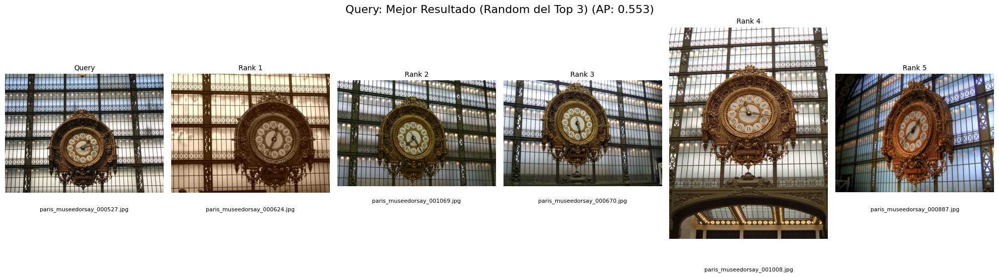

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_invalides_000230.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_000879.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000486.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_general_000025.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_001508.jpg


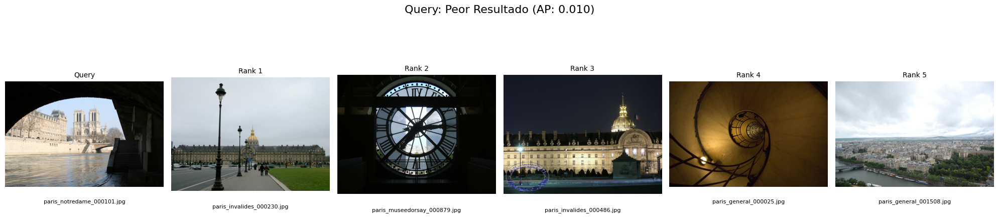

In [84]:
random_best_idx, worst_idx = display_query_and_top5(ranks, cfg['gnd'], cfg)

### Rparis

In [63]:
ranks,cfg=main('rparis6k', 'SIFT')

Extrayendo descriptores SIFT para rparis6k


Extrayendo Caracteristicas: 100%|██████████| 70/70 [00:15<00:00,  4.62it/s]


Entrenando KMeans para rparis6k
Total descriptores: (6105174, 128)
Modelo KMeans guardado en: ./features/SIFT/rparis6k\kmeans_model.pkl
Codificando imágenes de base de datos para rparis6k


Codificando imágenes: 100%|██████████| 6322/6322 [01:08<00:00, 92.80it/s] 


Vectores codificados guardados en: ./features/SIFT/rparis6k\image_vectors.npy
Codificando imágenes de queries para rparis6k


Codificando imágenes: 100%|██████████| 70/70 [00:00<00:00, 92.92it/s]


Vectores codificados guardados en: ./features/SIFT/rparis6k\query_vectors.npy
Calculando similitud y evaluando resultados
Resultados para rparis6k
mAP Easy: 0.437
mAP Medium: 0.339
mAP Hard: 0.146


Query: Mejor Resultado (Random del Top 3) - data\datasets\rparis6k\jpg\paris_notredame_000888.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_notredame_000265.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_notredame_000179.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_notredame_000628.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_notredame_000909.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_notredame_000545.jpg


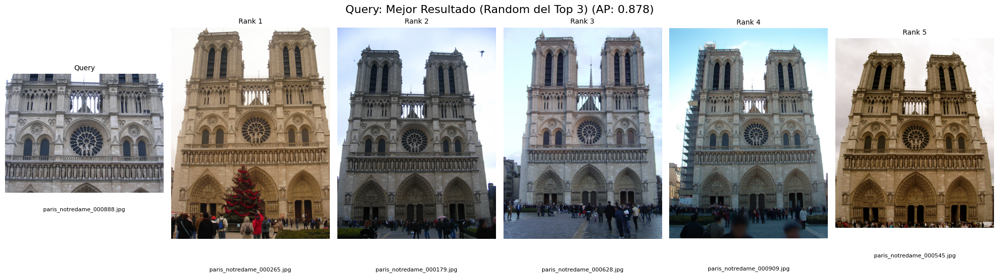

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_general_002169.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_notredame_000836.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000024.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_museedorsay_000811.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_000758.jpg


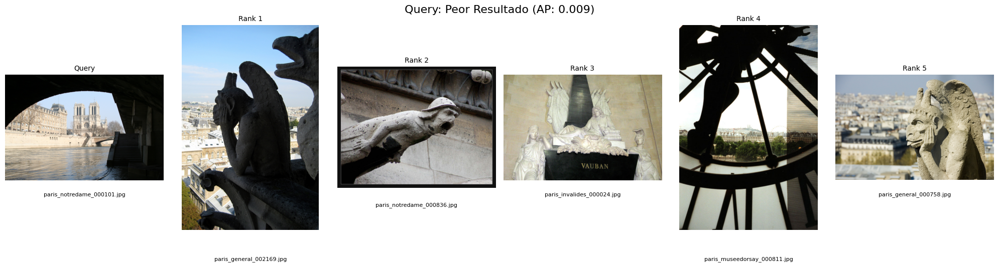

In [64]:
random_best_idx_rparis, worst_idx_rparis = display_query_and_top5(ranks, cfg['gnd'], cfg)

## Obtencion de resultados CNN

### Roxford

In [65]:
ranks,cfg=main('roxford5k','CNN')

Extrayendo características CNN para roxford5k


j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extrayendo Caracteristicas: 100%|██████████| 70/70 [00:05<00:00, 13.32it/s]


Entrenando KMeans para roxford5k
Total descriptores: (5063, 1000)
Modelo KMeans guardado en: ./features/CNN/roxford5k\kmeans_model.pkl
Codificando imágenes de base de datos para roxford5k


Codificando imágenes: 100%|██████████| 4993/4993 [00:13<00:00, 356.68it/s]


Vectores codificados guardados en: ./features/CNN/roxford5k\image_vectors.npy
Codificando imágenes de queries para roxford5k


Codificando imágenes: 100%|██████████| 70/70 [00:00<00:00, 358.19it/s]


Vectores codificados guardados en: ./features/CNN/roxford5k\query_vectors.npy
Calculando similitud y evaluando resultados
Resultados para roxford5k
mAP Easy: 0.121
mAP Medium: 0.087
mAP Hard: 0.021


Query: Mejor Resultado - data\datasets\rparis6k\jpg\paris_museedorsay_000527.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_museedorsay_000624.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_001069.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_museedorsay_000670.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_museedorsay_001008.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_museedorsay_000887.jpg


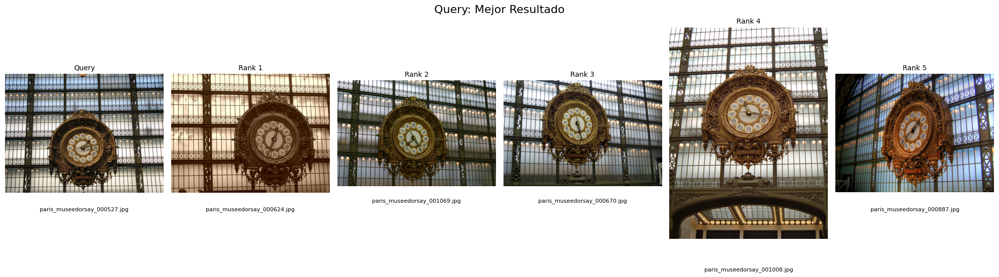

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_invalides_000230.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_000879.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000486.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_general_000025.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_001508.jpg


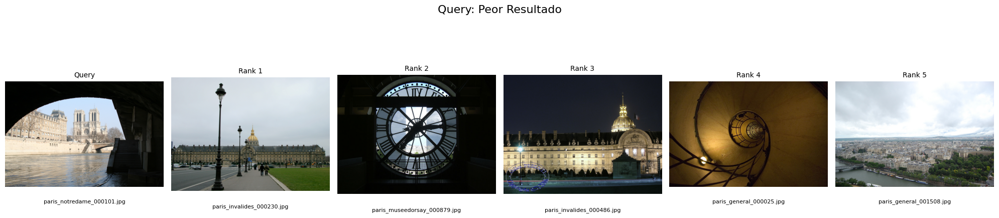

In [85]:
display_query_and_top5_with_specific_query(ranks, cfg['gnd'], cfg, random_best_idx, worst_idx)

### Rparis

In [67]:
rank,cfg=main('rparis6k','CNN')

Extrayendo características CNN para rparis6k


j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extrayendo Caracteristicas: 100%|██████████| 70/70 [00:05<00:00, 13.58it/s]


Entrenando KMeans para rparis6k
Total descriptores: (6392, 1000)
Modelo KMeans guardado en: ./features/CNN/rparis6k\kmeans_model.pkl
Codificando imágenes de base de datos para rparis6k


Codificando imágenes: 100%|██████████| 6322/6322 [00:19<00:00, 330.18it/s]


Vectores codificados guardados en: ./features/CNN/rparis6k\image_vectors.npy
Codificando imágenes de queries para rparis6k


Codificando imágenes: 100%|██████████| 70/70 [00:00<00:00, 356.21it/s]


Vectores codificados guardados en: ./features/CNN/rparis6k\query_vectors.npy
Calculando similitud y evaluando resultados
Resultados para rparis6k
mAP Easy: 0.110
mAP Medium: 0.089
mAP Hard: 0.036


Query: Mejor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000888.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_notredame_000786.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_notredame_000491.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_notredame_000557.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_notredame_000485.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_notredame_000456.jpg


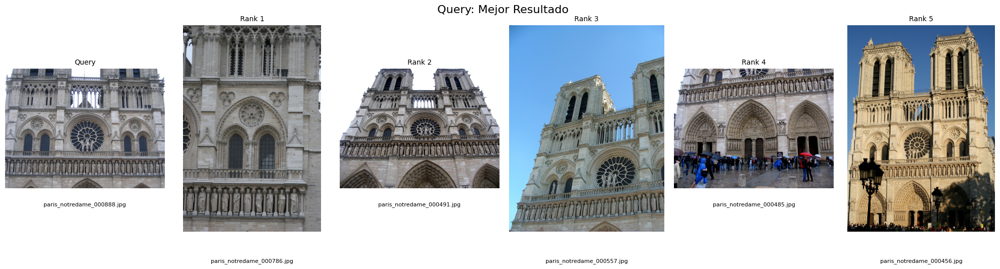

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_invalides_000230.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_000879.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000486.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_general_000025.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_001508.jpg


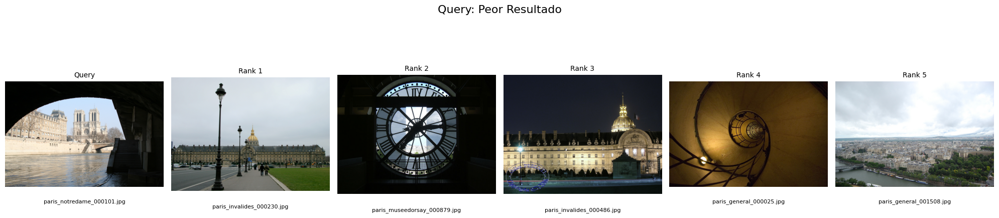

In [86]:
display_query_and_top5_with_specific_query(ranks, cfg['gnd'], cfg, random_best_idx_rparis, worst_idx_rparis)

## Obtencion de resultados CNN Mejorada

### Roxford

In [69]:
ranks,cfg=main('roxford5k','STRATEGY3')

Extrayendo características con GeM Pooling


j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extrayendo CNN con GeM: 100%|██████████| 70/70 [00:05<00:00, 12.83it/s]


Aplicando PCA Whitening sobre 5063 descriptores...
PCA Whitening guardado en: ./features/STRATEGY3/roxford5k\pca_whitening.pkl


Codificando con PCA Whitening: 100%|██████████| 70/70 [00:00<00:00, 704.39it/s]


Calculando similitud y evaluando resultados
Resultados para roxford5k - Estrategia 3
mAP Easy: 0.206
mAP Medium: 0.140
mAP Hard: 0.042


Query: Mejor Resultado - data\datasets\rparis6k\jpg\paris_museedorsay_000527.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_museedorsay_000624.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_001069.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_museedorsay_000670.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_museedorsay_001008.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_museedorsay_000887.jpg


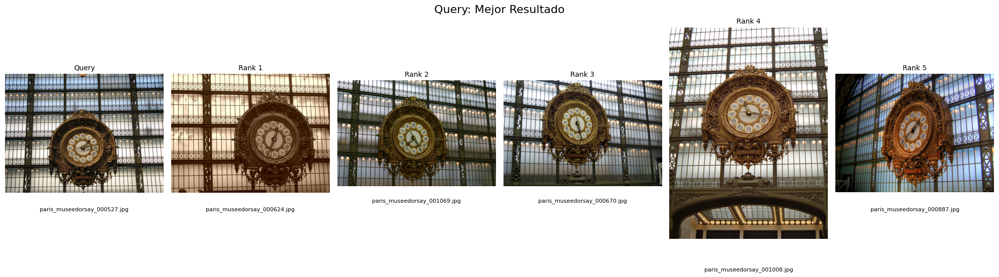

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_invalides_000230.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_000879.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000486.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_general_000025.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_001508.jpg


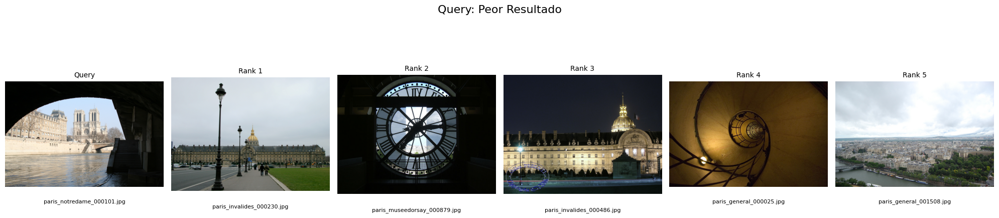

In [87]:
display_query_and_top5_with_specific_query(ranks, cfg['gnd'], cfg, random_best_idx, worst_idx)

### Rparis

In [71]:
ranks,cfg=main('rparis6k','STRATEGY3')

Extrayendo características con GeM Pooling


j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
j:\Proyecto\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extrayendo CNN con GeM: 100%|██████████| 70/70 [00:05<00:00, 13.03it/s]


Aplicando PCA Whitening sobre 6392 descriptores...
PCA Whitening guardado en: ./features/STRATEGY3/rparis6k\pca_whitening.pkl


Codificando con PCA Whitening: 100%|██████████| 70/70 [00:00<00:00, 308.59it/s]


Calculando similitud y evaluando resultados
Resultados para rparis6k - Estrategia 3
mAP Easy: 0.226
mAP Medium: 0.154
mAP Hard: 0.044


Query: Mejor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000888.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_notredame_000786.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_notredame_000491.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_notredame_000557.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_notredame_000485.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_notredame_000456.jpg


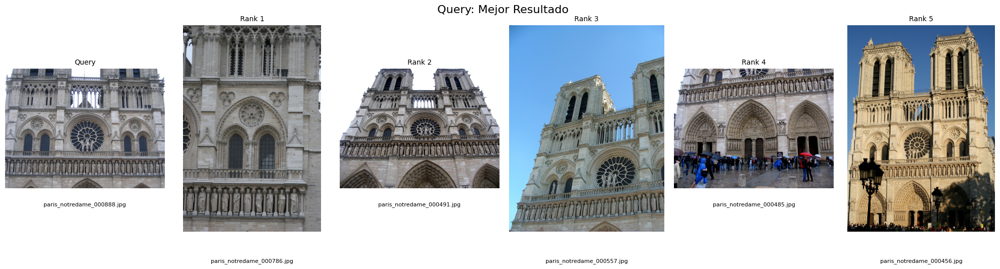

Query: Peor Resultado - data\datasets\rparis6k\jpg\paris_notredame_000101.jpg
Rank 1: data\datasets\rparis6k\jpg\paris_invalides_000230.jpg
Rank 2: data\datasets\rparis6k\jpg\paris_museedorsay_000879.jpg
Rank 3: data\datasets\rparis6k\jpg\paris_invalides_000486.jpg
Rank 4: data\datasets\rparis6k\jpg\paris_general_000025.jpg
Rank 5: data\datasets\rparis6k\jpg\paris_general_001508.jpg


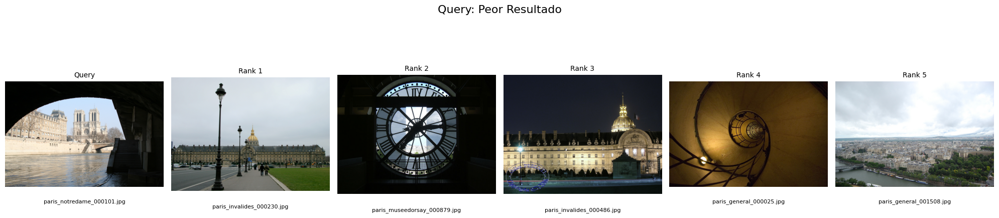

In [88]:
display_query_and_top5_with_specific_query(ranks, cfg['gnd'], cfg, random_best_idx_rparis, worst_idx_rparis)

### Parte de KD-Tree y PCA
Metodo basado en: https://www.youtube.com/watch?v=u7g1KXo6-QU&ab_channel=JuanManuelBarrios

Base de datos: (4993, 2048), Consultas: (70, 2048)

Búsqueda Lineal: Tiempo = 0.2325 segundos
Trees=1, Checks=10 -> Precisión=0.0%, Eficiencia=0.4%
Trees=1, Checks=50 -> Precisión=2.9%, Eficiencia=1.3%
Trees=1, Checks=100 -> Precisión=4.3%, Eficiencia=3.5%
Trees=1, Checks=200 -> Precisión=11.4%, Eficiencia=5.7%
Trees=1, Checks=500 -> Precisión=21.4%, Eficiencia=14.7%
Trees=1, Checks=1000 -> Precisión=32.9%, Eficiencia=29.8%
Trees=1, Checks=1500 -> Precisión=41.4%, Eficiencia=54.8%
Trees=1, Checks=2000 -> Precisión=54.3%, Eficiencia=63.5%
Trees=1, Checks=3000 -> Precisión=75.7%, Eficiencia=94.9%
Trees=1, Checks=5000 -> Precisión=100.0%, Eficiencia=144.6%
Trees=1, Búsqueda Exacta -> Precisión=100.0%, Eficiencia=128.0%
Trees=10, Checks=10 -> Precisión=1.4%, Eficiencia=0.4%
Trees=10, Checks=50 -> Precisión=2.9%, Eficiencia=1.7%
Trees=10, Checks=100 -> Precisión=5.7%, Eficiencia=3.5%
Trees=10, Checks=200 -> Precisión=12.9%, Eficiencia=6.5%
Trees=10, Checks=500 -> Precisión=27.1%, Eficiencia

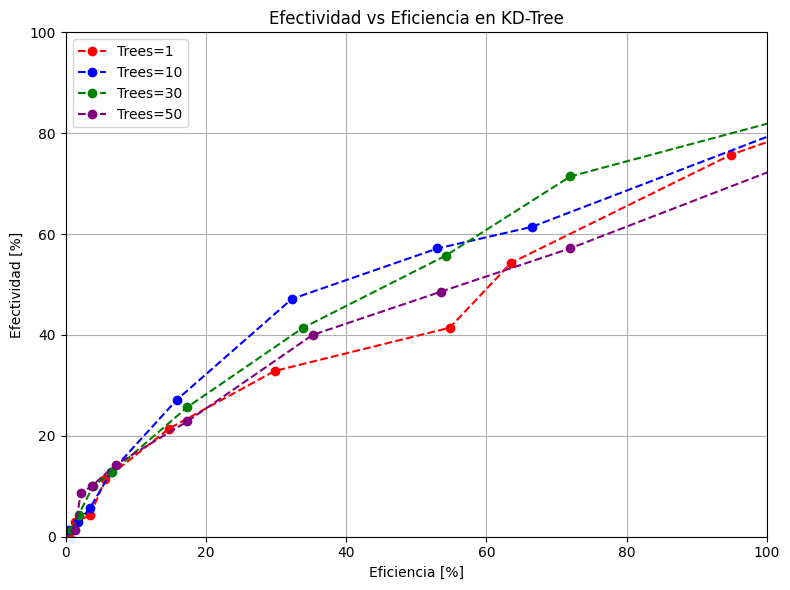

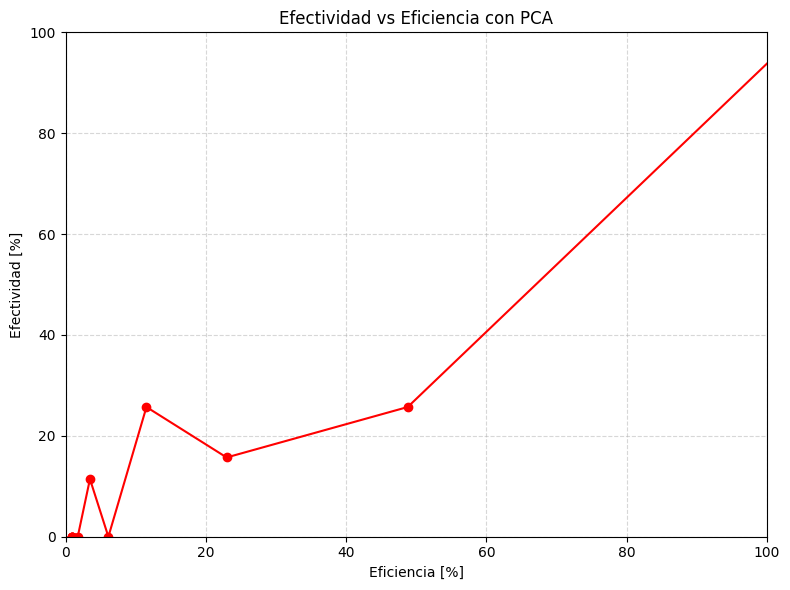

In [89]:
class Resultado:
    def __init__(self):
        self.segundos = 0
        self.precision = 0
        self.correctas = 0
        self.incorrectas = 0

def load_strategy3_data(data_path, query_path):
    data = np.load(data_path)
    queries = np.load(query_path)
    return data, queries

def evaluar_busqueda(nns, dists, ref_nns, ref_dists, tiempo):
    r = Resultado()
    for i in range(len(nns)):
        if nns[i] == ref_nns[i] or dists[i] == ref_dists[i]:
            r.correctas += 1
        else:
            r.incorrectas += 1
    r.segundos = tiempo
    r.precision = 100 * r.correctas / (r.correctas + r.incorrectas)
    return r

def pca_reduction(data, queries, n_components):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    reduced_queries = pca.transform(queries)
    return reduced_data, reduced_queries

def main2():
    data_path = './features/STRATEGY3/roxford5k/image_vectors.npy'
    query_path = './features/STRATEGY3/roxford5k/query_vectors.npy'
    dataset_r, dataset_q = load_strategy3_data(data_path, query_path)
    print(f"Base de datos: {dataset_r.shape}, Consultas: {dataset_q.shape}")
    flann = FLANN()
    flann.build_index(dataset_r, algorithm="linear")
    t0 = time.time()
    nns_LS, dists_LS = flann.nn_index(dataset_q, num_neighbors=1, cores=1)
    tiempo_lineal = time.time() - t0
    print(f"\nBúsqueda Lineal: Tiempo = {tiempo_lineal:.4f} segundos")
    tree_counts = [1, 10, 30, 50]
    checks_values = [10, 50, 100, 200, 500, 1000, 1500, 2000, 3000, 5000]
    results = {trees: {"efficiencies": [], "precisions": []} for trees in tree_counts}
    for trees in tree_counts:
        flann.build_index(dataset_r, algorithm="kdtree", trees=trees)
        for checks in checks_values:
            t0 = time.time()
            nns, dists = flann.nn_index(dataset_q, num_neighbors=1, cores=1, checks=checks)
            tiempo = time.time() - t0
            r = evaluar_busqueda(nns, dists, nns_LS, dists_LS, tiempo)
            results[trees]["efficiencies"].append(100 * tiempo / tiempo_lineal)
            results[trees]["precisions"].append(r.precision)
            print(f"Trees={trees}, Checks={checks} -> Precisión={r.precision:.1f}%, Eficiencia={(100 * tiempo / tiempo_lineal):.1f}%")
        
        # Búsqueda Exacta
        t0 = time.time()
        nns_exact, dists_exact = flann.nn_index(dataset_q, num_neighbors=1, cores=1, checks=-1)
        tiempo_exacto = time.time() - t0
        r_exacto = evaluar_busqueda(nns_exact, dists_exact, nns_LS, dists_LS, tiempo_exacto)
        results[trees]["efficiencies"].append(100 * tiempo_exacto / tiempo_lineal)
        results[trees]["precisions"].append(r_exacto.precision)
        print(f"Trees={trees}, Búsqueda Exacta -> Precisión={r_exacto.precision:.1f}%, Eficiencia={100 * tiempo_exacto / tiempo_lineal:.1f}%")
    pca_components = [1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]
    pca_efficiencies = []
    pca_precisions = []
    for n_components in pca_components:
        reduced_r, reduced_q = pca_reduction(dataset_r, dataset_q, n_components)
        t0 = time.time()
        flann.build_index(reduced_r, algorithm="linear")
        nns_pca, dists_pca = flann.nn_index(reduced_q, num_neighbors=1, cores=1)
        tiempo_pca = time.time() - t0
        r_pca = evaluar_busqueda(nns_pca, dists_pca, nns_LS, dists_LS, tiempo_pca)
        pca_efficiencies.append(100 * tiempo_pca / tiempo_lineal)
        pca_precisions.append(r_pca.precision)
        print(f"PCA (Dim={n_components}) -> Eficiencia={pca_efficiencies[-1]:.1f}%, Precisión={r_pca.precision:.1f}%")
    plt.figure(figsize=(8, 6))
    for trees, color in zip(tree_counts, ['red', 'blue', 'green', 'purple']):
        plt.plot(results[trees]["efficiencies"], results[trees]["precisions"],
                 marker='o', linestyle='--', linewidth=1.5, label=f'Trees={trees}', color=color)
    plt.title('Efectividad vs Eficiencia en KD-Tree')
    plt.xlabel('Eficiencia [%]')
    plt.ylabel('Efectividad [%]')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    # Gráfico PCA
    plt.figure(figsize=(8, 6))
    plt.plot(pca_efficiencies, pca_precisions, marker='o', linestyle='-', linewidth=1.5, color='red')
    plt.title('Efectividad vs Eficiencia con PCA')
    plt.xlabel('Eficiencia [%]')
    plt.ylabel('Efectividad [%]')
    plt.xlim(0, 100)
    plt.ylim(0, 100)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main2()
